# Notebook examples for Chapter 5
# Image Enhancement and Correction
In preparation for the treatment of supervised/unsupervised
classification and change detection, the
subjects of the final four chapters of this book, Chapter 5
focuses on preprocessing methods. These fall into the two general
categories of _image enhancement_  (Sections 5.1 through 5.4) and
_geometric correction_ (Sections 5.5 and 5.6). Discussion mainly focuses
on the processing of optical/infrared image data. However, Section 5.4
introduces polarimetric SAR imagery and treats the  problem of
speckle removal.

## 5.1 Lookup tables and histogram functions

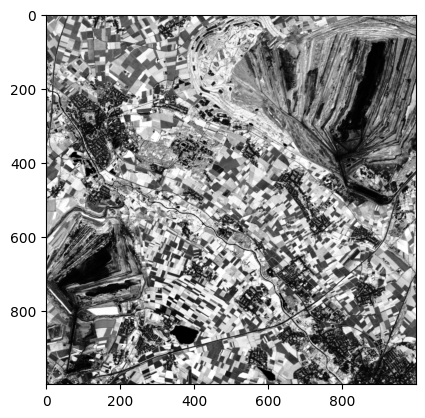

In [1]:
# histogram equalization
import numpy as np
import matplotlib.pyplot as plt
import auxil.auxil1 as auxil
from matplotlib import cm
from osgeo import gdal
from osgeo.gdalconst import GA_ReadOnly
gdal.AllRegister()
infile = 'imagery/AST_20070501.tif'
inDataset = gdal.Open(infile,GA_ReadOnly)     
cols = inDataset.RasterXSize
rows = inDataset.RasterYSize    
band = inDataset.GetRasterBand(3)  
image = band.ReadAsArray(0,0,cols,rows).astype(float)
plt.imshow(auxil.histeqstr(image),cmap=cm.gray)

## 5.2 High-pass filtering and feature extraction
### 5.2.1 Sobel filter

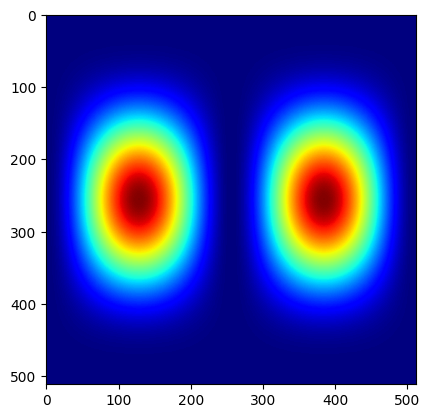

In [2]:
import numpy as np
from numpy import fft
import matplotlib.pyplot as plt
from matplotlib import cm
import auxil.auxil1 as auxil
%matplotlib inline
# create filter
g = np.zeros((512, 512),dtype=float)
g[:3,:3] = np.array([[1,0,-1], [2,0,-2],[1,0,-1]])
#  shift Fourier transform to center    
a = np.reshape(range(512**2),(512,512))
i = a % 512
j = a // 512
g = (-1)**(i+j)*g
# compute power spectrum and display in a linear stretch    
p = np.abs(fft.fft2(g))**2
plt.imshow(auxil.linstr(p), cmap=cm.jet)

#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_1.eps',bbox_inches='tight')

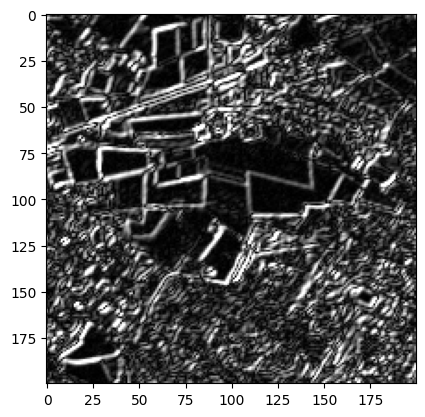

In [3]:
from osgeo import gdal
from osgeo.gdalconst import GA_ReadOnly
from scipy import ndimage
gdal.AllRegister()
infile = 'imagery/AST_20070501.tif'
inDataset = gdal.Open(infile,GA_ReadOnly)     
cols = inDataset.RasterXSize
rows = inDataset.RasterYSize    
band = inDataset.GetRasterBand(3)  
image = band.ReadAsArray(0,0,cols,rows).astype(float)
edges0 = ndimage.sobel(image,axis=0)
edges1 = ndimage.sobel(image,axis=1)
# combine and perform 2% saturated linear stretch
edges = auxil.lin2pcstr(np.abs(edges0+edges1))
plt.imshow(edges[200:400,200:400], cmap=cm.gray)   

#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_2.eps',bbox_inches='tight')

### 5.2.2 Laplacian of Gaussian filter

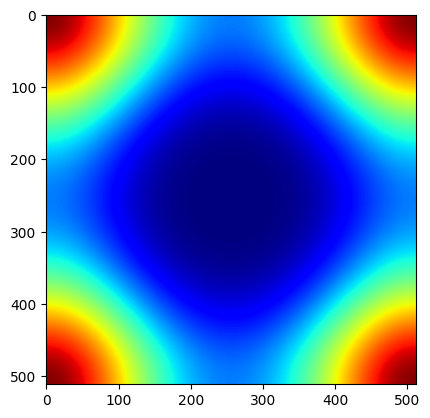

In [4]:
# Laplacian filter
g = np.zeros((512,512),dtype=float)
g[:3,:3] = np.array([[0,1,0],[1,-4,1],[0,1,0]])
#  shift Fourier transform to center    
a = np.reshape(range(512**2),(512,512))
i = a % 512
j = a // 512
g = (-1)**(i+j)*g
#  compute power spectrum and display    
p = np.abs(fft.fft2(g))**2
plt.imshow(auxil.linstr(p), cmap=cm.jet)

#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_3.eps',bbox_inches='tight')

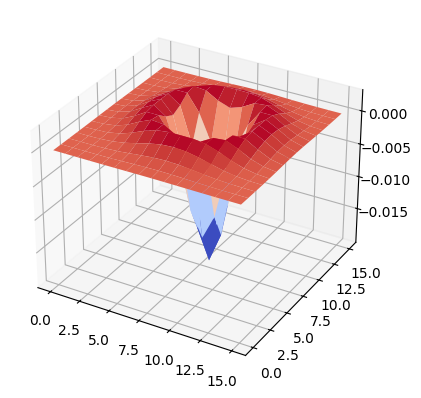

In [5]:
from mpl_toolkits.mplot3d import Axes3D
# Laplacian of Gaussian filter
sigma = 2.0
filt = np.zeros((16,16))
for i in range(16):
    for j in range(16):
        filt[i,j] = (1/(2*np.pi*sigma**6)) \
         *((i-8)**2+(j-8)**2-2*sigma**2) \
         *np.exp(-((i-8)**2+(j-8)**2)/(2*sigma**2))
fig = plt.figure() 
ax = fig.add_subplot(projection = '3d')
x, y = np.meshgrid(range(16),range(16))
ax.plot_surface(x, y, filt, cmap=cm.coolwarm)    

#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_4.eps',bbox_inches='tight')

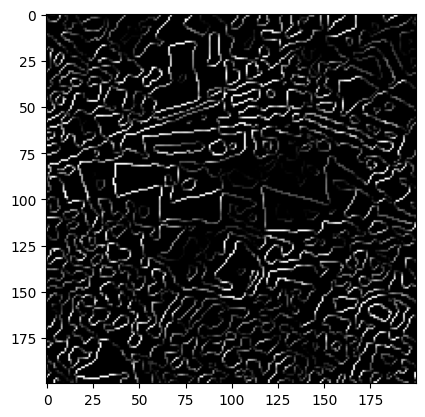

In [6]:
# pad the ASTER image
impad = np.zeros((rows+16,cols+16))
impad[:rows,:cols] = image
# pad the filter as well
filtpad = impad*0.0
filtpad[:16,:16] = filt
# flilter in frequency domain
im = np.real(fft.ifft2(fft.fft2(impad)*fft.fft2(filtpad)))
# get zero-crossings
idx = np.where( (im*np.roll(im,1,axis=0)<0) | \
                (im*np.roll(im,1,axis=1)<0) )
# get edge strengths
edges0 = ndimage.sobel(im,axis=0)
edges1 = ndimage.sobel(im,axis=1)
edges = auxil.lin2pcstr(np.abs(edges0+edges1))
# assign edge strengths at zero-crossings
im1 = 0.0*im
im1[idx] = edges[idx]
im1 = auxil.lin2pcstr(im1[200:400,200:400])
plt.imshow(im1,cmap=cm.gray) 

#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_5.eps',bbox_inches='tight')

### 5.2.3 OpenCV and GEE algorithms

In [7]:
%run scripts/ex5_1 -b 3 -a 1 imagery/AST_20070501.tif
%run scripts/ex5_1 -b 3 -a 2 imagery/AST_20070501.tif

result written to imagery/AST_20070501_corner.tif
result written to imagery/AST_20070501_canny.tif


<Figure size 640x480 with 0 Axes>

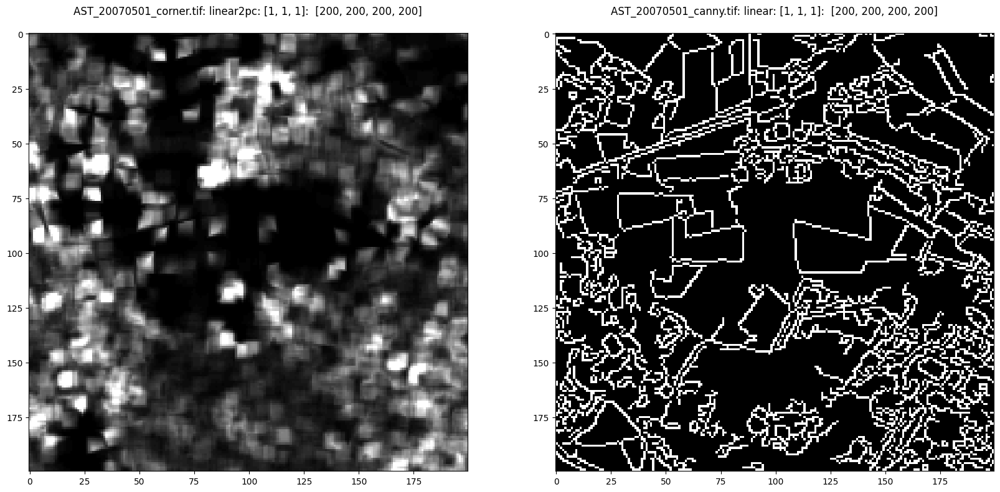

<Figure size 640x480 with 0 Axes>

In [8]:
%run scripts/dispms -f imagery/AST_20070501_corner.tif \
     -e 3 \
     -d [200,200,200,200] \
     -F imagery/AST_20070501_canny.tif -E 2 \
     -D [200,200,200,200] \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_6.eps'

In [ ]:
import ee
ee.Initialize()
im = ee.Image(
  'LANDSAT/LE07/C02/T1_RT_TOA/LE07_197025_20010626') \
       .select('B4')
edges = ee.Algorithms.CannyEdgeDetector(im,0.2)
gdexporttask = ee.batch.Export.image.toAsset(edges,
                      description='assetExportTask', 
                      assetId='projects/ee-mortcanty/assets/CRC5/canny',
                      scale=30,
                      maxPixels=1e9) 
gdexporttask.start()   

### 5.2.4 Invariant moments

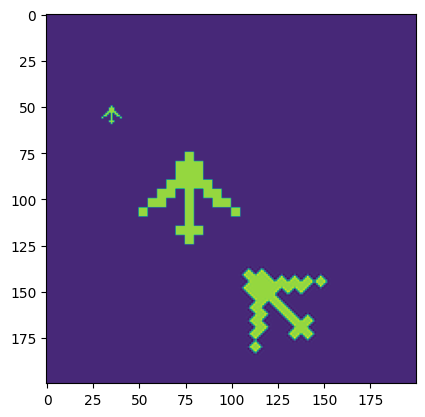

In [9]:
from scipy.ndimage import rotate
# Airplanes
A = np.array([[0,0,0,0,0,1,0,0,0,0,0], 
             [0,0,0,0,1,1,1,0,0,0,0], 
             [0,0,0,0,1,1,1,0,0,0,0], 
             [0,0,0,1,1,1,1,1,0,0,0], 
             [0,0,1,1,0,1,0,1,1,0,0], 
             [0,1,1,0,0,1,0,0,1,1,0], 
             [1,0,0,0,0,1,0,0,0,0,1], 
             [0,0,0,0,0,1,0,0,0,0,0], 
             [0,0,0,0,1,1,1,0,0,0,0], 
             [0,0,0,0,0,1,0,0,0,0,0]])
im = np.zeros((200,200))
im[50:60,30:41] = A
im1 = im*0
im1[75:125,50:105] = auxil.rebin(A,(50,55))
im2 = rotate(im1,45)
plt.imshow(im + im1 + im2[:200,:200])
#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_8.eps',bbox_inches='tight')

In [10]:
import cv2 as cv
hu = cv.HuMoments(cv.moments(im)).ravel()
hu1 = cv.HuMoments(cv.moments(im1)).ravel()
hu2 = cv.HuMoments(cv.moments(im2)).ravel()
print(hu[:4])
print(hu1[:4])
print(hu2[:4])

[3.32629630e-01 2.91524005e-04 2.10445657e-03 1.53810944e-03]
[3.37962963e-01 2.91524005e-04 2.10445657e-03 1.53810944e-03]
[3.37942897e-01 2.89959760e-04 2.10184377e-03 1.53694740e-03]


In [ ]:
run scripts/ex5_2 -b 1 imagery/AST_20070501.tif

## 5.3 Panchromatic sharpening

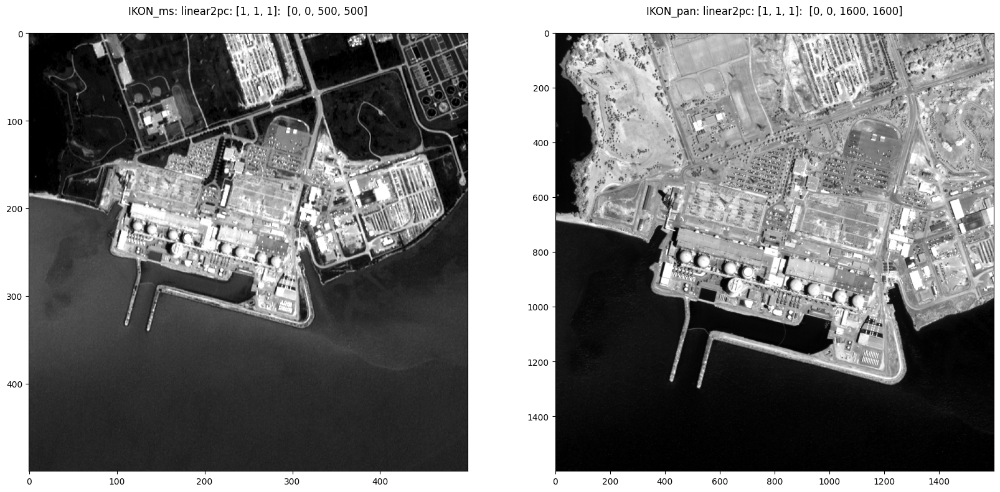

<Figure size 640x480 with 0 Axes>

In [11]:
run scripts/dispms -f imagery/IKON_ms -e 3 -F imagery/IKON_pan -E 3

### 5.3.1 HSV fusion

In [ ]:
import ee
ee.Initialize()
# Load a Landsat 8 top-of-atmosphere reflectance image.
image = \
 ee.Image('LANDSAT/LC08/C02/T1_TOA/LC08_044034_20140318')
# Convert the RGB bands to the HSV color space.
hsv = image.select(['B4', 'B3', 'B2']).rgbToHsv()
# Swap in the panchromatic band and convert back to RGB.
sharpened = ee.Image.cat([
  hsv.select('hue'), hsv.select('saturation'),
  image.select('B8')]).hsvToRgb()

In [ ]:
gdexporttask = ee.batch.Export.image.toAsset(sharpened,
                      description='assetExportTask', 
                      assetId='projects/ee-mortcanty/assets/sharpened',
                      scale=15,
                      maxPixels=1e9) 
gdexporttask.start()  

### 5.3.2 Brovey fusion
### 5.3.3 PCA fusion
### 5.3.4 DWT fusion

In [12]:
run scripts/dwt -r 4 -b 4 -d [50,100,200,200] imagery/IKON_ms imagery/IKON_pan

   DWT Pansharpening
Thu Mar 20 13:25:53 2025
MS  file: imagery/IKON_ms
PAN file: imagery/IKON_pan
Wavelet correlations:
Band 1:    0.820   0.639   0.402
Band 2:    0.819   0.659   0.429
Band 3:    0.790   0.615   0.400
Band 4:    0.720   0.570   0.394
Result written to imagery/IKON_ms_pan_dwt


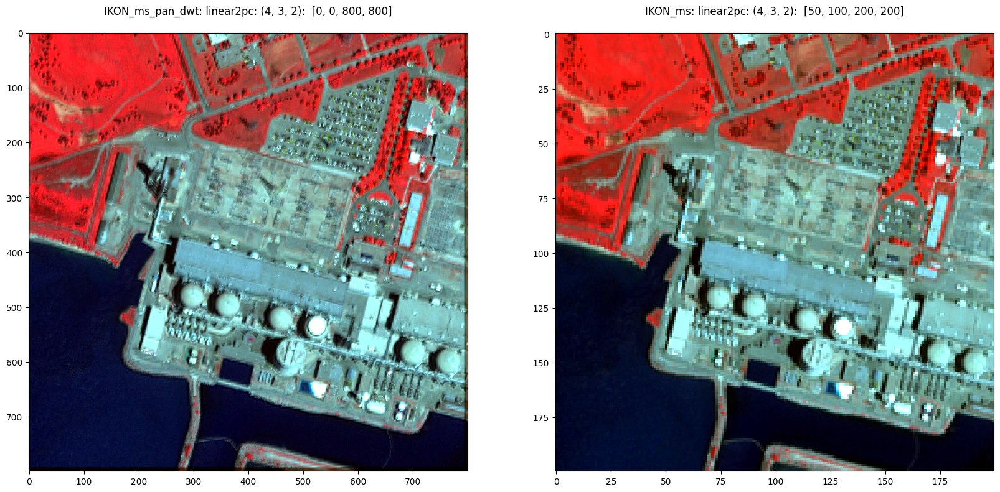

<Figure size 640x480 with 0 Axes>

In [13]:
%run scripts/dispms -f imagery/IKON_ms_pan_dwt \
                                   -p [4,3,2] -e 3 \
-F imagery/IKON_ms -D [50,100,200,200] \
                                   -P [4,3,2] -E 3 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_12.eps'

### 5.3.5 A trous fusion

In [14]:
%run scripts/atwt -r 4 -b 4 -d [50,100,200,200] imagery/IKON_ms imagery/IKON_pan

   ATWT Pansharpening
Thu Mar 20 13:26:36 2025
MS  file: imagery/IKON_ms
PAN file: imagery/IKON_pan
Wavelet correlations:
Band 1:    0.435
Band 2:    0.421
Band 3:    0.389
Band 4:    0.404
Result written to imagery/IKON_ms_pan_atwt


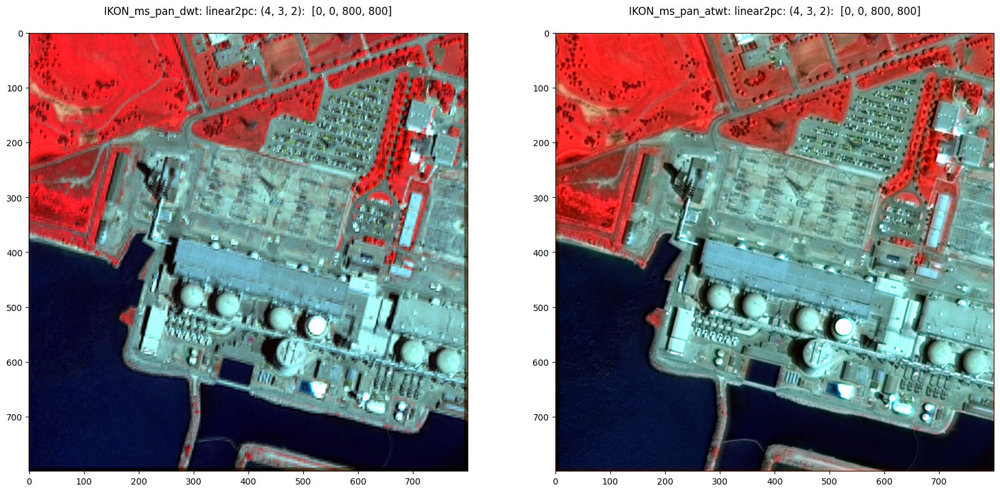

<Figure size 640x480 with 0 Axes>

In [15]:
%run scripts/dispms -f imagery/IKON_ms_pan_dwt -p [4,3,2] -e 3 \
-F imagery/IKON_ms_pan_atwt -P [4,3,2] -E 3 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_14.eps'

### 5.3.6 A quality index

## 5.4 Radiometric correction of polarimetric SAR imagery
### 5.4.1 Speckle statistics
### 5.4.2 Multi-look data
__Note:__ The RADARSAT-2 image used in the text is not available in the imagery folder. The examples are replaced by a dual pol Sentinel-1 image over the Frankfurt Airport

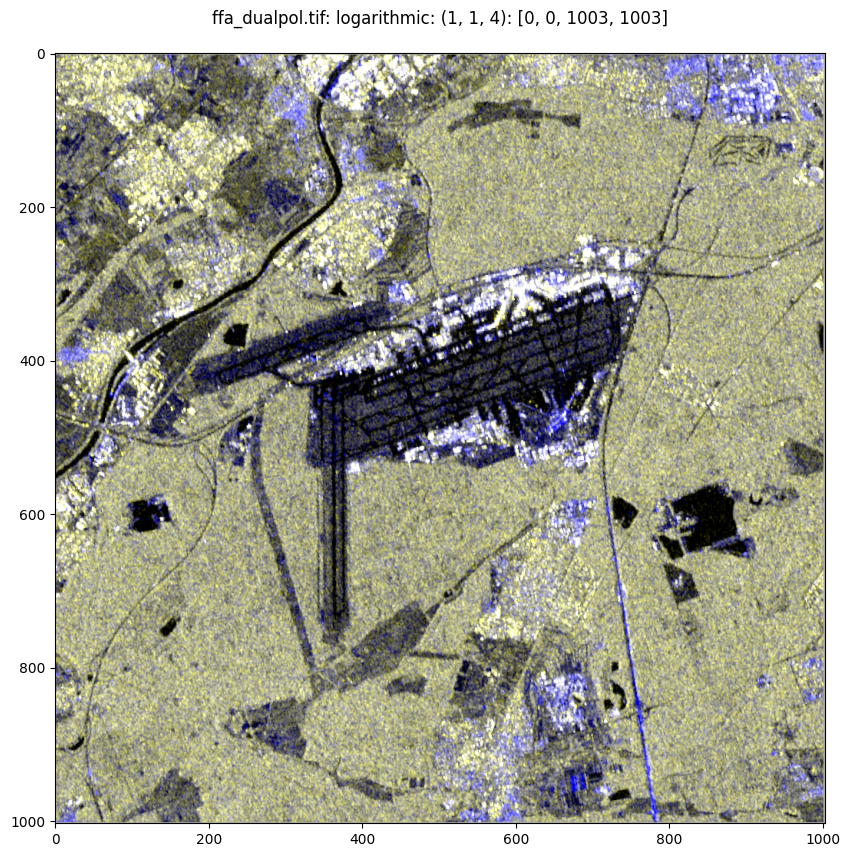

<Figure size 640x480 with 0 Axes>

In [16]:
#%run scripts/dispms -f myimagery/RS2_20090829.tif -p [6,9,1] \
%run scripts/dispms -f imagery/ffa_dualpol.tif -p [1,1,4] \
#-s 'imagery/s1_ffa.eps'

In [ ]:
%run scripts/enlml imagery/ffa_dualpol.tif

     ENL Estimation
Thu Mar 20 13:27:43 2025
infile:  imagery/ffa_dualpol.tif
Dual polarimetry
filtering...
row: 
100 
200 
300 
400 


In [ ]:
%run scripts/dispms -f imagery/ffa_dualpol_enl.tif -p [1,1,1] -e 3 \
#-s 'imagery/s1_ffa_enl.eps' -F imagery/users-mortcanty-s1_ffa_dualpol_0.tif -P [1,1,1] -E 5

### 5.4.3 Speckle filtering
#### 5.4.3.1 Minimum mean square error (mmse) filter

In [ ]:
%run scripts/mmse_filter imagery/ffa_dualpol.tif 12.5

In [ ]:
%run scripts/dispms -f imagery/ffa_dualpol_mmse.tif -p [1,1,1]  \
-F imagery/ffa_dualpol.tif -P [1,1,1] 

#### 5.4.3.2 Gamma-MAP filter

In [ ]:
!ipcluster start -n 4 --daemonize

In [ ]:
%run scripts/gamma_filter imagery/ffa_dualpol.tif 12.5

In [ ]:
%run scripts/dispms -f imagery/ffa_dualpol_mmse.tif -p [1,1,1]   \
-F imagery/ffa_dualpol_gamma.tif -P [1,1,1] 

#### 5.4.3.3 Temporal filtering

In [ ]:
import ee, math
ee.Initialize()

# convert from decibels to linear scale
def linearize(current):
    return current.multiply(
      ee.Image.constant(math.log(10.0)/10.0)).exp()

# collect a time series
rect = ee.Geometry.Rectangle([6.31,50.83,6.58,50.95]);
collection = ee.ImageCollection('COPERNICUS/S1_GRD')\
.filterBounds(rect)\
.filterDate(ee.Date('2017-05-01'),ee.Date('2017-06-01'))\
.filter(ee.Filter.eq('resolution_meters', 10)) \
.filter(ee.Filter.eq('orbitProperties_pass','ASCENDING'))\
.map(linearize)  

# series length
count =  collection.toList(100).length()            
print('series length: %i'%count.getInfo())

# temporally filtered image band
filtered = collection.mean().select(0).clip(rect)

# unfiltered image band for comparison
unfiltered = ee.Image(collection.first()).select(0)\
                                        .clip(rect)
    
# export to Google Drive
outimage = ee.Image.cat(unfiltered,filtered)
gdexport = ee.batch.Export.image.toDrive(outimage,
     description='driveExportTask', 
     folder = 'EarthEngineImages',
     fileNamePrefix='temporalfiltered',scale=10)                
gdexport.start() 

In [ ]:
%run scripts/dispms -f imagery/temporalfiltered.tif \
                     -d [800,400,600,600] -p [1,1,1]\
                   -F imagery/temporalfiltered.tif \
                     -D [800,400,600,600] -P [2,2,2] \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_20.eps'   

## 5.5 Topographic correction
### 5.5.1 Rotation, scaling and translation
### 5.5.2 Imaging transformations
### 5.5.3 Camera models and RFM approximations
### 5.5.4 Stereo imaging and digital elevation models

In [ ]:
%run scripts/dispms -f imagery/AST_3N -e 3 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_24.eps'

In [ ]:
%run scripts/dispms -f imagery/AST_3B -e 3 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_25.eps'

In [ ]:
from osgeo import gdal
from osgeo.gdalconst import GDT_Float32
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import correlate, correlation_lags
gdal.AllRegister()
# grab the ASTER nadir and back-looking images
inDataset1 = gdal.Open('imagery/AST_3N')
cols = inDataset1.RasterXSize
rows = inDataset1.RasterYSize  
image1 = np.array(inDataset1.GetRasterBand(1) \
             .ReadAsArray(0,0,cols,rows), dtype=float)  
inDataset2 = gdal.Open('imagery/AST_3B')
image2 = np.array(inDataset2.GetRasterBand(1) \
             .ReadAsArray(0,0,cols,rows), dtype=float)   
# ASTER stereo geometry
height = 705.0 #km
base = 370.0   #km
res = 15.0     #m
# the parallex DEM
p = np.zeros([cols, rows], dtype = float) - 20
for i in range(25, rows-25):
    for j in range(7, cols-7):     
        im1 = image1[i-7:i+7, j-7:j+7]
        im2 = image2[i-25:i+25, j-7:j+7]
        # center the image patches        
        im1 = (im1 - np.mean(im1)) 
        im2 = (im2 - np.mean(im2)) 
        # 2-dimensional cross-correlation
        corr = correlate(im1, im2, mode='valid')
        # lag of maximum correlation index along y-axis
        lags = correlation_lags(im1.shape[0], 
                      im2.shape[0], mode='valid')
        max_index = np.unravel_index(np.argmax(corr), 
                      corr.shape) 
        yoff =  lags[max_index[0]]
        if (yoff < -20) or (yoff > -5):
            p[i,j] = p[i,j-1]
        else:
            p[i,j] = yoff
dem =  p*res*(height/base)   

driver = inDataset1.GetDriver()
outDataset = driver.Create('imagery/fig5_26',cols,rows,1,GDT_Float32)
outBand = outDataset.GetRasterBand(1)
outBand.WriteArray(dem,0,0)
outBand.FlushCache()
%run scripts/dispms -f 'imagery/fig5_26'  -p [1,1,1] -e 4 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_26.eps'

In [ ]:
%run scripts/dispms -f imagery/AST_DEM -e 4 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_27.eps'

### 5.5.5 Slope and aspect

In [ ]:
!gdaldem slope imagery/AST_DEM imagery/ASTslope.tif

In [ ]:
!gdaldem aspect imagery/AST_DEM imagery/ASTaspect.tif

In [ ]:
%run scripts/dispms -f imagery/ASTslope.tif \
  -F imagery/ASTaspect.tif \
#-s  '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_29.eps' 

### 5.5.6 Illumination correction

In [ ]:
# Download LS5 and DEM images from EarthEngine
import ee
import IPython.display as disp

ee.Initialize()

rect = ee.Geometry.Rectangle([-124.705,48.414,-123.799,49.026])
image = ee.Image('LANDSAT/LT05/C02/T1/LT05_048026_19840717') \
          .select('B1','B2','B3','B4','B5','B7') \
          .clip(rect)     
crs = image.projection().crs().getInfo()
    
dem = ee.Image('USGS/SRTMGL1_003').clip(rect)

# export to Google Drive
gdexport = ee.batch.Export.image.toDrive(image,
     description='driveExportTask', 
     folder = 'EarthEngineImages',
     fileNamePrefix='LS19840717',scale=30)                
gdexport.start() 

gdexport = ee.batch.Export.image.toDrive(dem,
     description='driveExportTask', 
     folder = 'EarthEngineImages',
     crs = crs, 
     fileNamePrefix='SRTM',scale=30)                
gdexport.start() 

In [ ]:
%run scripts/dispms -f imagery/LS19840717.tif -e 3 -p [4,5,6] -d [100,500,1600,1600] \
-F imagery/SRTM.tif -E 3 -D [100,500,1600,1600] \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_31.eps'

In [ ]:
%run scripts/pca -d [100,500,1600,1600] imagery/LS19840717.tif

In [ ]:
%run scripts/dispms -f imagery/LS19840717_pca.tif -e 3 -p [1,2,3]

In [ ]:
%run scripts/em -p [1,2,3] -K 3 imagery/LS19840717_pca.tif

In [ ]:
%run scripts/dispms -f  imagery/LS19840717_pca_em.tif -c \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_32.eps'

In [ ]:
%run scripts/c_corr -d [100,500,1600,1600] \
  -c imagery/LS19840717_pca_em.tif \
  132.9 54.9 imagery/LS19840717.tif imagery/SRTM.tif 

In [ ]:
%run scripts/dispms -f imagery/LS19840717.tif -d [100,500,1000,1000] -p [4,4,4] -e 3  \
-F imagery/LS19840717_corr.tif -P [4,4,4] -D [0,0,1000,1000] -E 3 \
#-s '/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_34.eps'

## 5.6 Image-image registration
### 5.6.1 Frequency domain registration

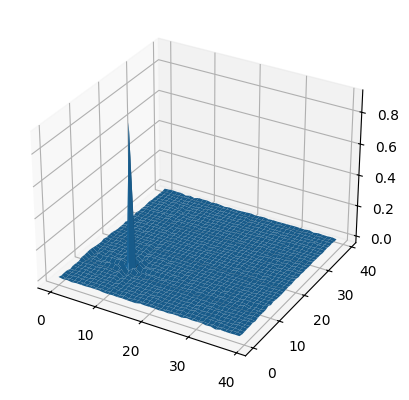

In [1]:
from osgeo import gdal
from osgeo.gdalconst import GA_ReadOnly
import numpy as np
from numpy import fft
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# grab an image band
gdal.AllRegister()
inDataset = gdal.Open('imagery/AST_20070501.tif')
cols = inDataset.RasterXSize
rows = inDataset.RasterYSize  
band = inDataset.GetRasterBand(3) \
             .ReadAsArray(0,0,cols,rows)  

# calculate and invert cross-power spectrum
g1 = band[10:522,10:522]
g2 = band[0:512,0:512]
f1 = fft.fft2(g1)
f2 = fft.fft2(g2)
g = fft.ifft2(f2*np.conj(f1)/np.absolute(f1)**2)

# plot
fig = plt.figure()
ax = fig.add_subplot(projection = '3d')
x, y = np.meshgrid(range(40),range(40))
ax.plot_surface(x, y, np.real(g[0:40,0:40]))

#plt.savefig('/home/mort/LaTeX/new projects/CRC5/Chapter5/fig5_35.eps',bbox_inches='tight')

In [2]:
# frequency domain registration of two ASTER images over Iran
%run auxil/registerms.py -b 3 imagery/AST_20010409 imagery/AST_20010730

--------------------------------
        Register
---------------------------------
Thu Mar 20 20:03:36 2025
reference image: imagery/AST_20010409
warp image: imagery/AST_20010730
warp band: 3
Warped image written to: imagery/AST_20010730_warp
elapsed time: 3.1601972579956055


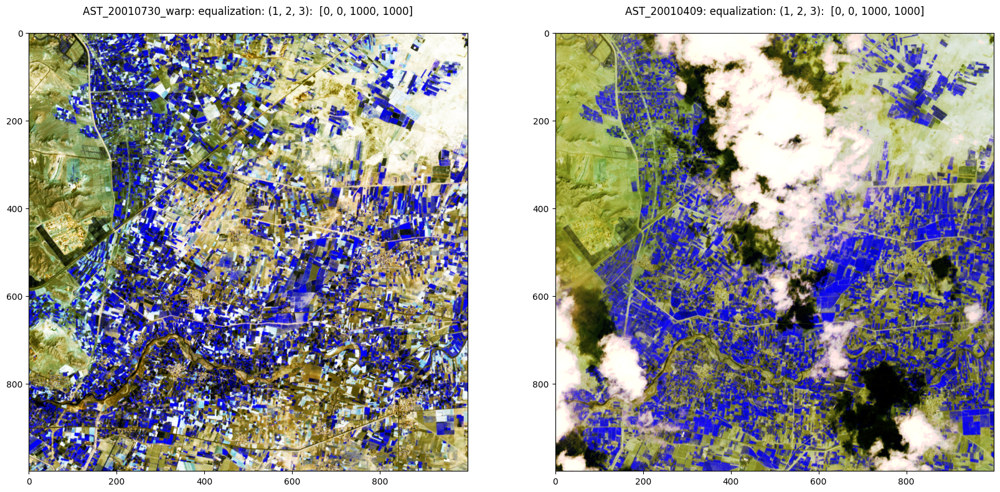

In [3]:
%run scripts/dispms -f imagery/AST_20010730_warp -p [1,2,3] -e 4 -F imagery/AST_20010409 -P [1,2,3] -E 4

### 5.6.2 Feature matching
### 5.6.3 Resampling with ground control points

In [4]:
run scripts/ex5_3 imagery/gcps.pts

RST transformation:
[[ 9.99972110e-01 -2.02991329e-03  2.10315125e+02]
 [ 2.02991329e-03  9.99972110e-01 -1.84336787e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
RMS: 0.504769
